In [2]:
import os
import cv2
import numpy as np
import pandas as pd

from tqdm import tqdm_notebook
import matplotlib.pyplot as plt

In [3]:
df = pd.read_csv('./clustering2.csv', encoding='utf-8', index_col=0)

In [4]:
df.head()

,filename,0,1,2,3,4,5,6,7,8,...,2040,2041,2042,2043,2044,2045,2046,2047,cluster,center_distance
0,0.jpg,0.538921,0.277842,0.211032,0.688597,0.185452,0.011790,0.730540,1.207996,0.353460,...,0.161039,0.020428,0.108557,0.375065,0.752277,0.228633,0.100316,0.238573,0,12.912765
1,1.jpg,0.034592,0.369639,0.285800,0.384725,0.161416,0.087499,0.072540,0.054384,0.099075,...,0.417268,0.411512,0.309312,0.799908,0.390913,0.036137,0.323454,0.408953,4,11.271339
2,10.jpg,0.327455,0.172024,0.471271,0.691185,0.073252,0.192843,0.303251,0.252891,0.429027,...,0.111094,0.906809,0.254723,1.594207,1.123552,0.449776,0.011376,0.476048,0,14.281709
3,100.jpg,0.455779,0.937296,1.336042,0.189010,0.308206,0.088695,0.333553,0.254512,0.093298,...,0.881172,1.004324,0.065228,0.354559,0.178113,0.522083,0.709399,0.235006,0,10.513697
4,1000.jpeg,0.158576,0.593128,0.319609,0.634666,0.258412,0.307201,0.383449,1.362908,0.106569,...,0.323253,1.327696,0.239198,0.122088,1.716506,0.229803,1.230238,0.292252,2,14.737880


In [5]:
cluster = df[df['cluster']==0].sort_values(by='center_distance')[:50]
cluster = cluster.reset_index()
cluster.head()

,index,filename,0,1,2,3,4,5,6,7,...,2040,2041,2042,2043,2044,2045,2046,2047,cluster,center_distance
0,33621,4698.jpg,0.388170,0.511069,0.478106,0.222304,0.050888,0.014675,0.121675,0.234698,...,0.216632,0.963909,0.262187,0.005207,0.151305,0.078821,1.279926,0.194357,0,8.148360
1,907,112.jpg,0.715823,0.728997,0.834660,0.296206,0.010789,0.025603,0.097706,0.553076,...,0.151018,1.095921,0.248371,0.147162,0.146199,0.121087,1.343254,0.069224,0,8.261053
2,35973,49373.jpg,0.367187,0.275056,0.293703,0.435456,0.036290,0.008185,0.035705,0.285013,...,0.726770,0.031551,0.372423,0.093734,0.506142,0.134226,0.702346,0.164834,0,8.322972
3,11484,23736.jpg,0.630184,0.720056,0.658088,0.257971,0.048976,0.018547,0.075067,0.376337,...,0.534592,0.308802,0.002427,0.135886,0.121624,0.216119,0.589280,0.136391,0,8.364428
4,35509,4887.jpg,0.177084,0.184123,0.261634,0.361686,0.085169,0.013213,0.064441,0.484579,...,0.595143,0.096606,0.136661,0.316019,0.120966,0.067523,0.543190,0.010597,0,8.435651


In [18]:
np.random.choice(df[df['cluster']==0]['filename'].values, 2000, replace=False)

array(['59724.jpg', '19051.jpg', '41320.jpg', ..., '40179.jpg',
       '57271.jpg', '31231.jpg'], dtype=object)

In [14]:
df.head()

,filename,0,1,2,3,4,5,6,7,8,...,2040,2041,2042,2043,2044,2045,2046,2047,cluster,center_distance
0,0.jpg,0.538921,0.277842,0.211032,0.688597,0.185452,0.011790,0.730540,1.207996,0.353460,...,0.161039,0.020428,0.108557,0.375065,0.752277,0.228633,0.100316,0.238573,0,12.912765
1,1.jpg,0.034592,0.369639,0.285800,0.384725,0.161416,0.087499,0.072540,0.054384,0.099075,...,0.417268,0.411512,0.309312,0.799908,0.390913,0.036137,0.323454,0.408953,4,11.271339
2,10.jpg,0.327455,0.172024,0.471271,0.691185,0.073252,0.192843,0.303251,0.252891,0.429027,...,0.111094,0.906809,0.254723,1.594207,1.123552,0.449776,0.011376,0.476048,0,14.281709
3,100.jpg,0.455779,0.937296,1.336042,0.189010,0.308206,0.088695,0.333553,0.254512,0.093298,...,0.881172,1.004324,0.065228,0.354559,0.178113,0.522083,0.709399,0.235006,0,10.513697
4,1000.jpeg,0.158576,0.593128,0.319609,0.634666,0.258412,0.307201,0.383449,1.362908,0.106569,...,0.323253,1.327696,0.239198,0.122088,1.716506,0.229803,1.230238,0.292252,2,14.737880


In [ ]:
# def random_choice(cluster_number):
#     train_set = np.random.choice(df[df['cluster']==cluster_number]['filename'].values, 2000, replace=False)
#     test_set = np.random.choice(df[df['cluster']==cluster_number]['filename'].values, 400, replace=False)

(-0.5, 223.5, 223.5, -0.5)

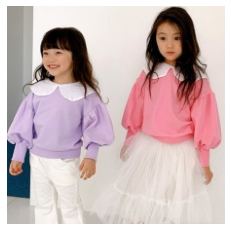

In [25]:
path = 'C:/Users/sanghui/Desktop/toyproject/DL_Project_5/hsh/data/2_15_crop'
file = path + '/' + cluster['filename'][0]
src = cv2.imread(file, cv2.IMREAD_COLOR)
src = cv2.cvtColor(src, cv2.COLOR_BGR2RGB)
plt.imshow(src)
plt.axis('off')

In [28]:
path = 'C:/Users/sanghui/Desktop/toyproject/DL_Project_5/hsh/data/2_15_crop'

def get_neighbor(id):
    cluster = df[df['cluster']==id].sort_values(by='center_distance')[:50]
    cluster = cluster.reset_index()
    plt.figure(figsize=(50, 50))
    
    # show item that exist near cluster centroid
    for i, row in tqdm_notebook(cluster.iterrows()):
        file = path + '/' + row['filename']
        plt.subplot(5, 10, i+1)
        src = cv2.imread(file, cv2.IMREAD_COLOR)
        src = cv2.cvtColor(src, cv2.COLOR_BGR2RGB)
        plt.imshow(src)
        plt.title(f'Cluster: {id}, distance: {row["center_distance"]: .4f}')
        plt.axis('off')
    plt.show()

C:\Users\sanghui\AppData\Local\Temp/ipykernel_20608/230766989.py:9: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  for i, row in tqdm_notebook(cluster.iterrows()):


0it [00:00, ?it/s]

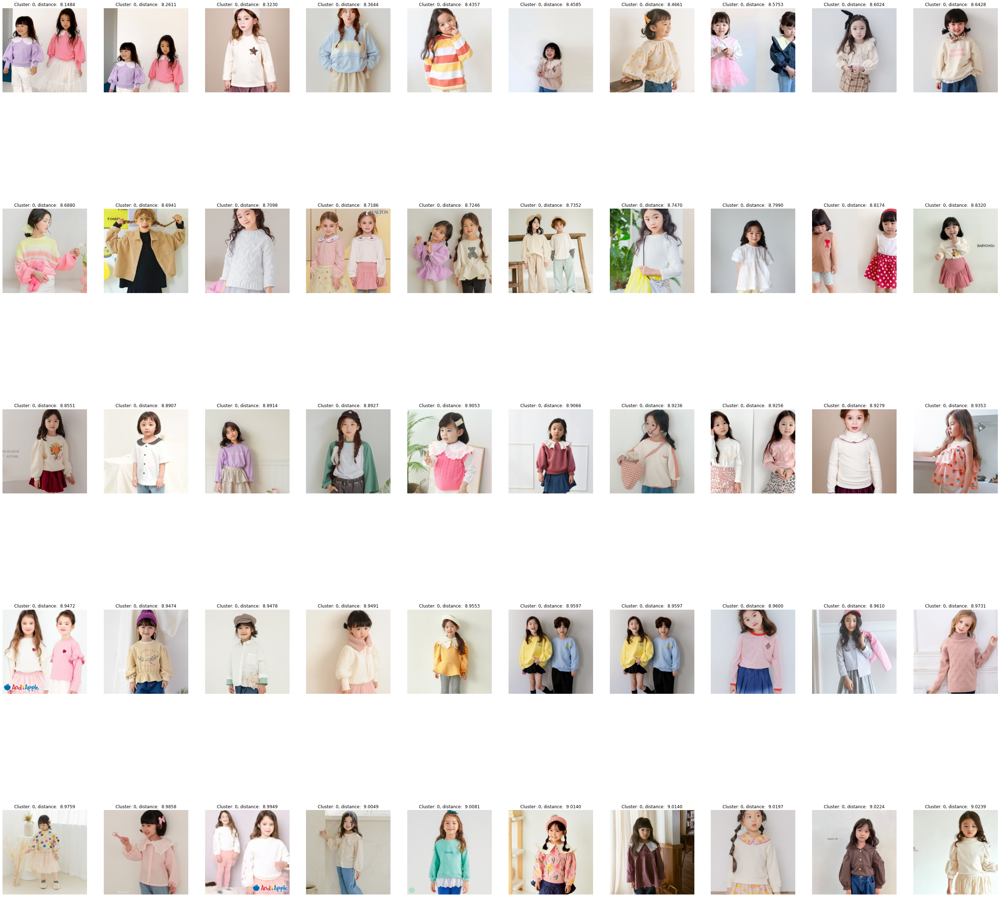

In [29]:
get_neighbor(0)

C:\Users\sanghui\AppData\Local\Temp/ipykernel_20608/230766989.py:9: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  for i, row in tqdm_notebook(cluster.iterrows()):


0it [00:00, ?it/s]

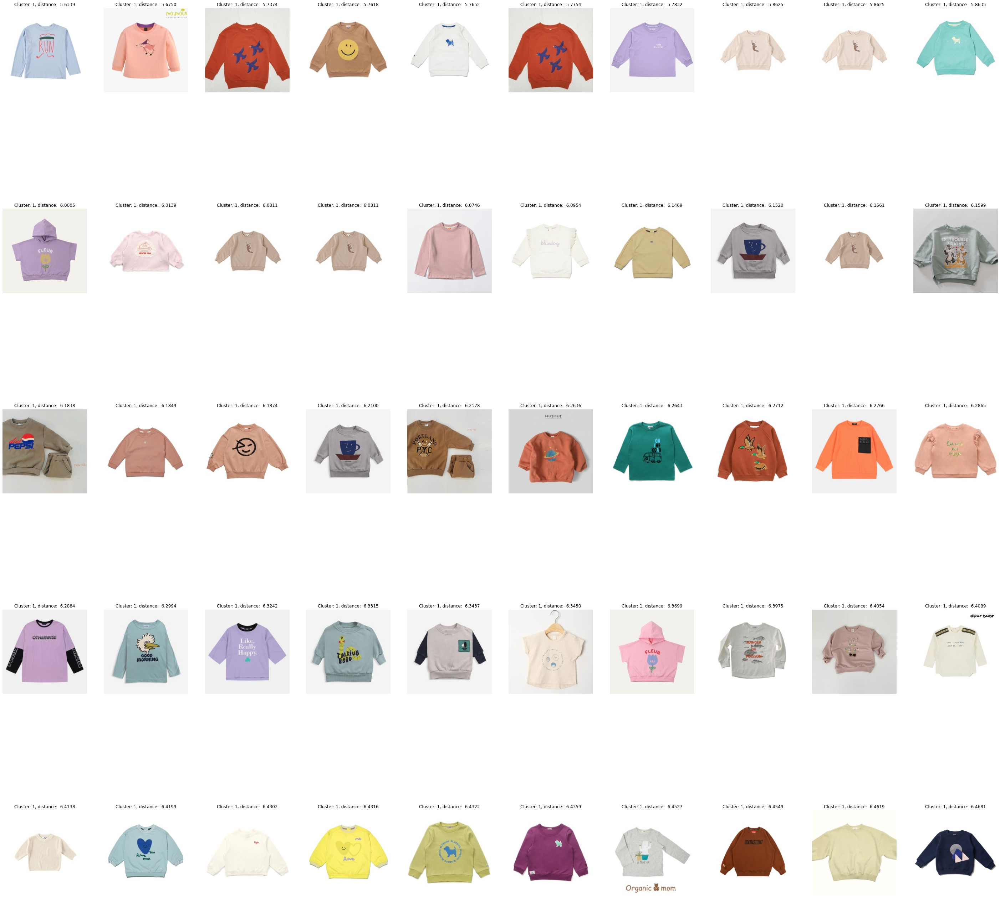

In [30]:
get_neighbor(1)

C:\Users\sanghui\AppData\Local\Temp/ipykernel_20608/230766989.py:9: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  for i, row in tqdm_notebook(cluster.iterrows()):


0it [00:00, ?it/s]

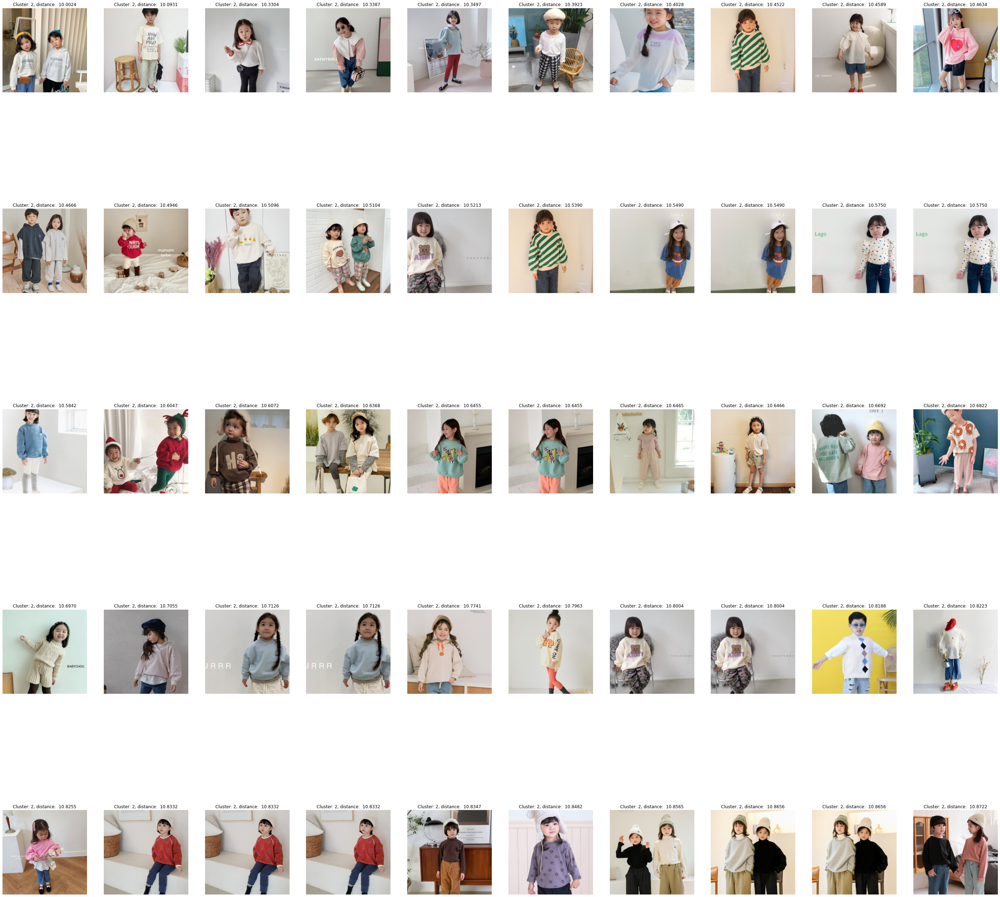

In [31]:
get_neighbor(2)

C:\Users\sanghui\AppData\Local\Temp/ipykernel_20608/230766989.py:9: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  for i, row in tqdm_notebook(cluster.iterrows()):


0it [00:00, ?it/s]

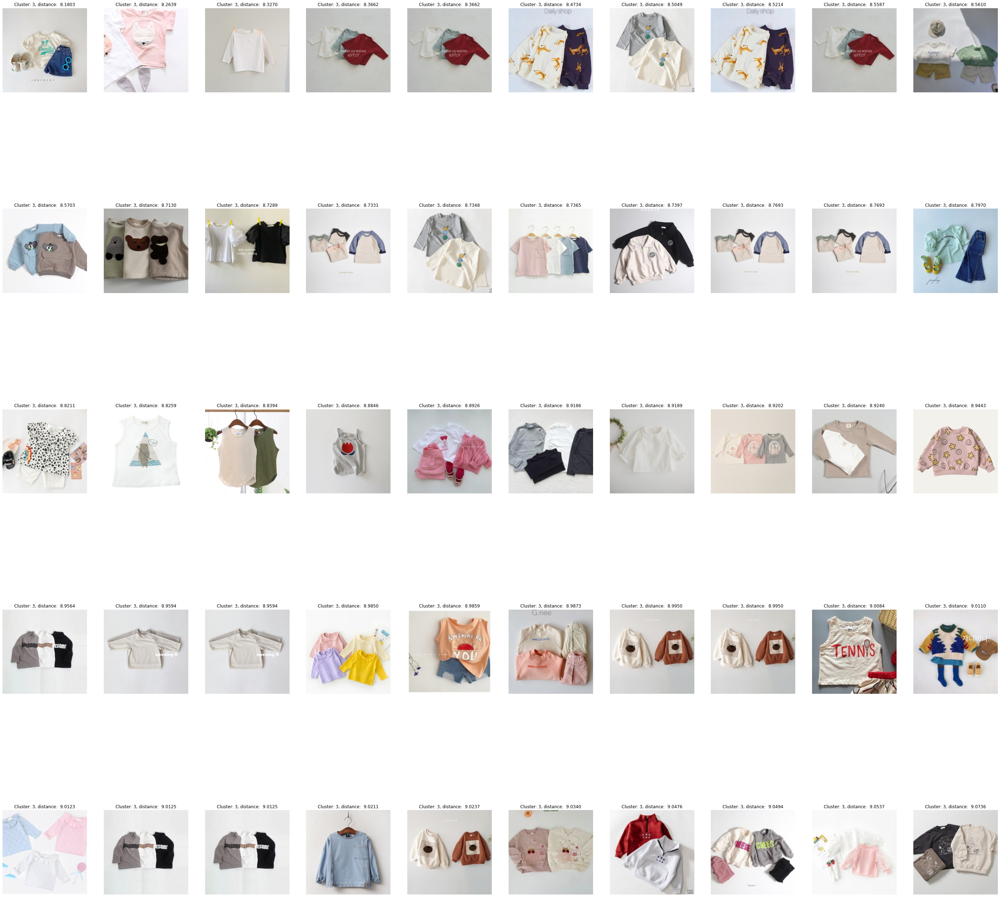

In [32]:
get_neighbor(3)

C:\Users\sanghui\AppData\Local\Temp/ipykernel_20608/230766989.py:9: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  for i, row in tqdm_notebook(cluster.iterrows()):


0it [00:00, ?it/s]

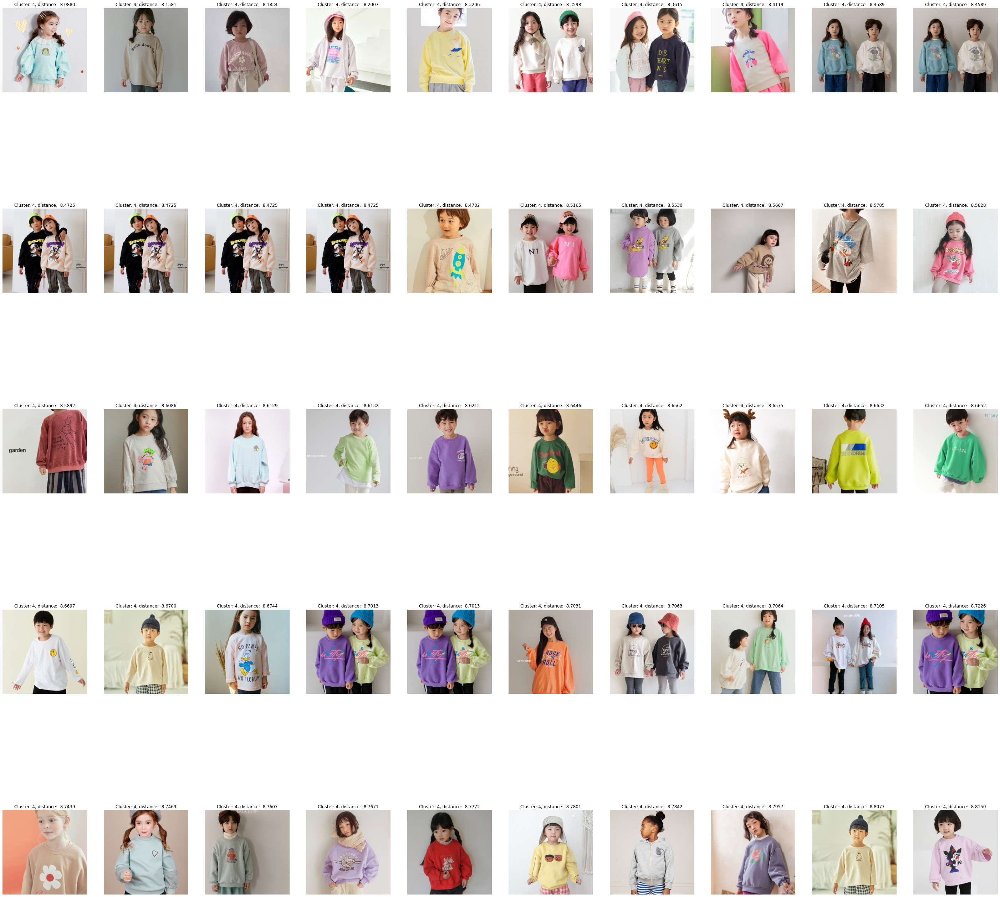

In [33]:
get_neighbor(4)

- 해당 카테고리 안에서 클러스터링된 결과 상품의 종류가 아니라 상품 이미지 특성에 따라 다시 클러스터링이 수행된 결과를 볼 수 있는것 같다.

In [5]:
from sklearn.model_selection import train_test_split

In [6]:
X = []
y = []

path = 'C:/Users/sanghui/Desktop/toyproject/DL_Project_5/hsh/data/2_15_crop'

train_set = np.random.choice(df[df['cluster']==cluster_number]['filename'].values, 2000, replace=False)
test_set = np.random.choice(df[df['cluster']==cluster_number]['filename'].values, 400, replace=False)

# for file in tqdm_notebook(os.listdir(path)):
#     file_path = path + '/' + file
#     src = cv2.imread(file_path, cv2.IMREAD_COLOR)
#     dst = cv2.resize(src, dsize=(299, 299), interpolation=cv2.INTER_CUBIC)
#     X.append(dst)
#     y.append(df[df['filename'] == file]['cluster'].values[0])   

for i in tqdm_notebook(range(5)):
    random_set = np.random.choice(df[df['cluster']==i]['filename'].values, 2400, replace=False)
    for file in random_set:
        file_path = path + '/' + file
        src = cv2.imread(file_path, cv2.IMREAD_COLOR)
        dst = cv2.resize(src, dsize=(299, 299), interpolation=cv2.INTER_CUBIC)
        X.append(dst)
        y.append(df[df['filename'] == file]['cluster'].values[0]) 

C:\Users\sanghui\AppData\Local\Temp/ipykernel_3660/3377020597.py:6: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  for file in tqdm_notebook(os.listdir(path)):


  0%|          | 0/51260 [00:00<?, ?it/s]

In [7]:
X = np.array(X)
y = np.array(y)

In [8]:
X.shape, y.shape

((51260, 299, 299, 3), (51260,))

In [9]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, stratify=y, random_state=42, shuffle=True)

In [10]:
from tensorflow.keras.models import Sequential
from tensorflow.keras import optimizers, losses, activations, models
from tensorflow.keras.layers import Convolution2D, Dense, Input, Flatten, Dropout, MaxPooling2D, BatchNormalization, GlobalAveragePooling2D, Concatenate
from tensorflow.keras import applications
from keras.applications.inception_v3 import preprocess_input

In [11]:
input_shape = (299, 299, 3)

base_model = applications.InceptionV3(weights='imagenet', include_top=False, input_shape=input_shape)

base_model.trainable = False

add_model = Sequential()
add_model.add(base_model)
add_model.add(GlobalAveragePooling2D())
add_model.add(Dropout(0.5))
add_model.add(Dense(5, activation='softmax'))

model = add_model

model.compile(loss='sparse_categorical_crossentropy', optimizer='adam', metrics=['accuracy'])
model.summary()



Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 inception_v3 (Functional)   (None, 8, 8, 2048)        21802784  
                                                                 
 global_average_pooling2d (G  (None, 2048)             0         
 lobalAveragePooling2D)                                          
                                                                 
 dropout (Dropout)           (None, 2048)              0         
                                                                 
 dense (Dense)               (None, 5)                 10245     
                                                                 
Total params: 21,813,029
Trainable params: 10,245
Non-trainable params: 21,802,784
_________________________________________________________________


In [13]:
hist = model.fit(X_train, y_train, validation_data=(X_test, y_test), epochs=10, batch_size=32, verbose=1)

Epoch 1/10


KeyboardInterrupt: 

In [ ]:
plot_target = ['loss', 'val_loss', 'accuracy', 'val_accuracy']

plt.figure(figsize=(12, 8))

for each in plot_target:
    plt.plot(hist.history[each], label=each)

plt.legend()
plt.grid()
plt.show()